# 2024 San Pedro de Atacama Mw 7.4 (us7000n05d) — moment tensor + finite fault at 127 km depth

**Event:** 2024-07-19 01:50:48.57 UTC, 23.0791°S 67.8404°W, hypocentre 127 km — the largest
intermediate-depth earthquake in the Calama–San Pedro cluster since 1950, ~80 km ESE of the
2026 Calama M6.9 analysed in nb24. Intraslab normal faulting inside the subducted Nazca slab.
USGS Mww: **171.85/21.14/−79.92 (Mw 7.4, centroid 120.5 km)**.

**Why this event matters to us: a live nodal-plane dispute.**
- The **USGS operational finite-fault model** puts the slip on the **shallow plane (172/21)**.
- **Jia et al. (2025, Nat. Comms.)**, using 54 teleseismic + 47 strong-motion stations + GNSS
  and aftershock relocations + directivity, argue for the **steep plane (341/71)**: five
  subevents at 120–180 km depth, average rupture velocity 4.2 km/s ≈ 0.93 Vs (the "forbidden
  zone" — interpreted as mixed subshear + episodic supershear), rupture initiating by
  dehydration embrittlement and transitioning to thermal runaway past the ~650 °C isotherm.

nb24 showed that for the compact 2026 M6.9, teleseismic data **cannot** distinguish the planes
(misfits 0.1402 vs 0.1424, a 1.6% near-tie). The question here: with a rupture ~4× larger in
linear dimension, do teleseismic body waves alone become decisive — and which side do they take?

**Answer (this notebook): yes, and they side with Jia.** Under a comparison that is fair by
construction (identical 62 body channels, no drops, no surface waves possible on either plane),
the steep plane fits ~9–10% better under every treatment — auto faults, independent re-anneals,
and identically enlarged fault domains — and its slip distribution independently reproduces
Jia's 120–180 km depth extent.

In [1]:
import os, json
import numpy as np, pandas as pd
from IPython.display import Image, display
import sys
sys.path.insert(0, os.path.expanduser('~/works/17.Venezuela_2026/scripts'))
B = os.path.expanduser('~/works/17.Venezuela_2026')
R = os.path.join(B, 'results')
E = os.path.join(B, 'event_2024_spda/20240719015048/ffm.0')

## Setting: same cluster as the 2026 event
The event sits in the 100–130+ km intermediate-depth Calama–San Pedro cluster (see nb24's
regional-context section: 1916/1950/1962/2005/2020/2024/2026 M6.8+ events). The 2024 M7.4 is
the modern instrumental benchmark for the cluster — and the only member with a published
near-field-constrained rupture model (Jia et al.), which makes it the natural validation
target for our teleseismic-only pipeline.

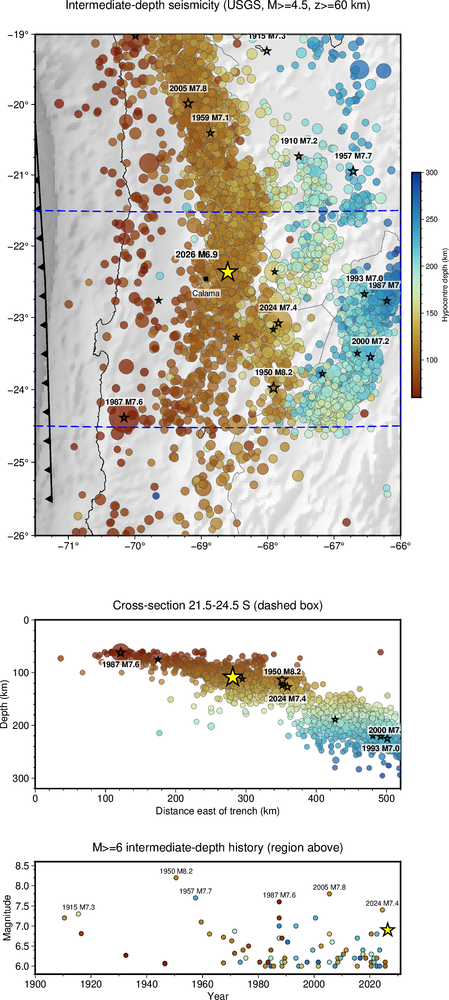

In [2]:
display(Image(os.path.join(B,'event_2026_calama/report/fig_regional_seismicity.png')))

## A. MTUQ moment tensor
Deep-event protocol from nb23/nb24, scaled for the larger event: source duration ~40 s, so the
long-period body band moves to **35–80 s** (`--bwband 35,80,150,12`: 150-s window holding the
P+pP+sP group, ±12 s shifts); surface waves 100–250 s (Mw≥7 mantle-wave setting); 26 stations.

| run | data | Mw | mechanism (s/d/r) | Kagan vs USGS Mww |
|---|---|---|---|---|
| SW-only (`--nobody`) | surface waves 100–250 s | 7.40 | 176/20/−70 | 6.3° |
| joint | body 35–80 s + surface waves | 7.25 | 166/20/−83 | **3.4°** |

The two protocols agree with each other to 5.0° (Kagan); adding body waves moves the mechanism
*closer* to the USGS W-phase solution. The joint conjugate, **338.6/70.2/−92.5, is 5.8° from
Jia's steep plane**. Our mechanism is 30.9° from the 2026 Calama one — same normal-faulting
family, distinctly different orientation.

**Full disclosure of a bug this event exposed.** Our runner's magnitude-dependent defaults
disable body waves for Mw ≥ 7 (SW-only is the safe default), and `--bwband` did not re-enable
them — so our first "joint" run was silently a duplicate of the SW-only run. Found when the
waveform-fit figure had no body panels to show; fixed (explicit band now implies
`use_bw=True`) and re-run. The corrected joint results are the ones above. Lesson (again):
**always look at the waveform fits; a missing panel is a missing dataset.**

**On the magnitude difference.** SW-only Mw 7.40 matches the Mww exactly; the joint run
prefers 7.25 because 35–80-s body waves favour a smaller moment for this long (~40 s) source.
We adopt the surface-wave-anchored Mw 7.40 for moment and read the joint run as the better
mechanism constraint — consistent with the WISP models (1.4e20 N·m, Mw 7.37).

In [3]:
for tag in ('mtuq_dc_2024spda/2024spda', 'mtuq_dc_spda_lpbody/spda_lpbody'):
    sol = json.load(open(os.path.join(R, tag + '_solution.json')))
    print(f"{tag.split('/')[0]:24s} Mw {sol['Mw']:.2f} | {sol['kappa']:.1f}/{np.degrees(np.arccos(sol['h'])):.1f}/{sol['sigma']:.1f} | depth {sol['depth_in_m']/1e3:.0f} km")

mtuq_dc_2024spda         Mw 7.40 | 175.5/20.4/-69.8 | depth 127 km
mtuq_dc_spda_lpbody      Mw 7.25 | 166.5/20.4/-83.2 | depth 127 km


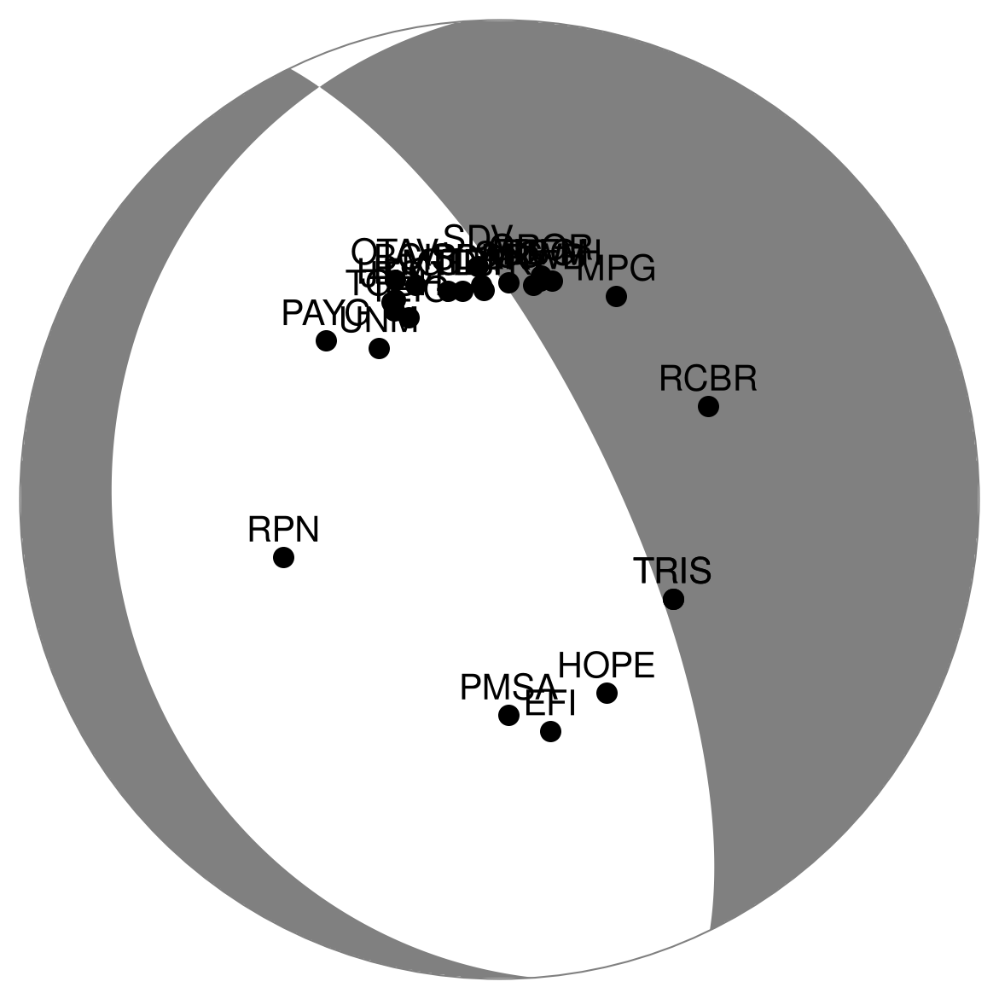

In [4]:
display(Image(os.path.join(R,'mtuq_dc_2024spda/2024spda_beachball.png')))

### A1. Surface-wave fits (Rayleigh + Love), SW-only inversion
Rayleigh (vertical Z + radial R) and Love (transverse T) fits at 100–250 s for all 26
stations, from the SW-only run (Mw 7.40, 176/20/−70). Black observed, red synthetic. These
are THE surface-wave fits for this event: at 100–250 s the ~50-km rupture is effectively a
point source, so the moment-tensor fits are the physically meaningful surface-wave check —
and unlike WISP's finite-fault Green's functions (see B3), MTUQ's syngine/ak135 Green's
functions have no source-depth limitation.

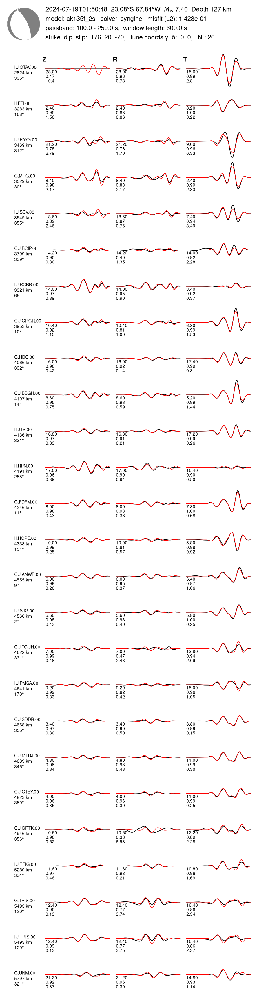

In [5]:
display(Image(os.path.join(R,'mtuq_dc_2024spda/2024spda_waveforms_sw.png')))

### A2. Joint waveform fits — body (35–80 s) + surface (100–250 s)
Black observed, red synthetic. The body columns are the panels that did not exist before the
`use_bw` fix.

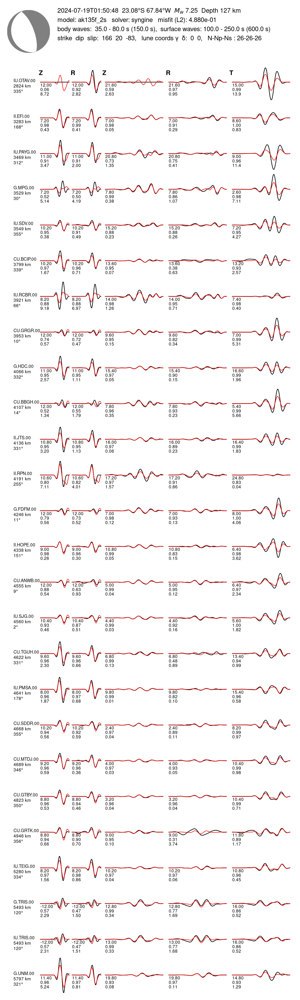

In [6]:
display(Image(os.path.join(R,'mtuq_dc_spda_lpbody/spda_lpbody_waveforms.png')))

### A3. Beyond the double couple: full moment tensor on the lune
Deep and intermediate-depth earthquakes are the classic setting for **non-double-couple**
sources, and USGS's own solutions for this event are only **62–69% DC**. We ran the full-MT
lune search (`12_run_mtuq_sota.py`, Tape & Tape semiregular grid, 1.05M sources) and a
deviatoric-constrained variant (`--deviatoric`), in two data configurations to test
robustness: **surface-wave-only** (100–250 s), and — following the principle that more
independent data is better — **joint** (adding the safe 35–80 s body band via `--bwband`).
Misfits compared **nested on each run's own grid** (DC = the v=0,w=0 slice; deviatoric = w=0):

| data | DC | deviatoric | full MT | best mechanism | CLVD γ | isotropic δ | %DC (deviatoric) |
|---|---|---|---|---|---|---|---|
| SW-only | 0.1509 | 0.1480 | 0.1323 | 162/18/−81 | −9.1° | +23.5° | 66% |
| **joint (body 35–80 s + SW)** | 0.5583 | 0.5423 | 0.4581 | 342/63/−81 | **−9.1°** | **+15.6°** | **66%** |

**What is robust, and what is not** (this table is the honest core):
- The **CLVD (γ = −9.1°, 66% DC) is identical in both configurations** and matches USGS's
  62–69% DC. It is the real, physical non-DC signal: a composite rupture whose subevents
  rotate mechanism — exactly Jia et al.'s "mechanism transition" — sums to a non-DC moment
  tensor even when each subevent is a clean DC.
- The **isotropic component is NOT robust: adding body waves shrank it from δ = +23.5° to
  +15.6°.** Genuine volumetric radiation of that size from a 127-km rupture would be
  extraordinary; the drop confirms it was largely 1-D-structure error absorbed by the free
  isotropic axis, and more independent data suppressed it. The variance-based lune likelihood
  did not converge, so we quote no formal significance for δ.
- The **defensible statement: ~66% DC with a modest −9° CLVD, no trustworthy isotropic term.**
- The joint full-MT best plane (342/63) is the STEEP plane — consistent with the finite-fault
  discrimination in section B.

In [7]:
def lune_coords(sol):  # Tape & Tape (2012) lune coords from the MT eigenvalues (numpy only)
    M = np.array([[sol['Mtt'],sol['Mtp'],sol['Mrt']],
                  [sol['Mtp'],sol['Mpp'],sol['Mrp']],
                  [sol['Mrt'],sol['Mrp'],sol['Mrr']]])
    l = np.sort(np.linalg.eigvalsh(M))[::-1]           # l1>=l2>=l3
    gamma = np.degrees(np.arctan2(-l[0]+2*l[1]-l[2], np.sqrt(3)*(l[0]-l[2])))
    beta  = np.degrees(np.arccos(l.sum()/(np.sqrt(3)*np.sqrt((l**2).sum()))))
    return gamma, 90.0-beta                            # gamma, delta
for tag in ('mtuq_sota_2024spda/2024spda', 'mtuq_sota_spda_lpbody/spda_lpbody'):
    sol = json.load(open(os.path.join(R, tag + '_solution.json')))
    g, d = lune_coords(sol)
    print(f"{tag.split('/')[0]:22s} Mw {sol['Mw']:.2f} | {sol['kappa']:.0f}/{np.degrees(np.arccos(sol['h'])):.0f}/{sol['sigma']:.0f} | gamma {g:+.1f} delta {d:+.1f}")

mtuq_sota_2024spda     Mw 7.40 | 162/18/-81 | gamma -9.1 delta +23.5
mtuq_sota_spda_lpbody  Mw 7.40 | 342/63/-81 | gamma -9.1 delta +15.6


**Full-MT waveform fits — joint (body 35–80 s + surface 100–250 s).** These are the fits
of the non-DC solution using both independent datasets; body columns (Z, R) and surface
columns (Z, R, T) are all genuinely fit.

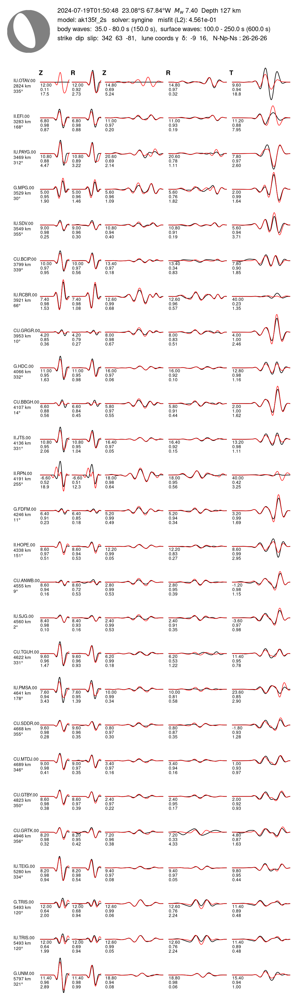

In [8]:
display(Image(os.path.join(R,'mtuq_sota_spda_lpbody/spda_lpbody_waveforms.png')))

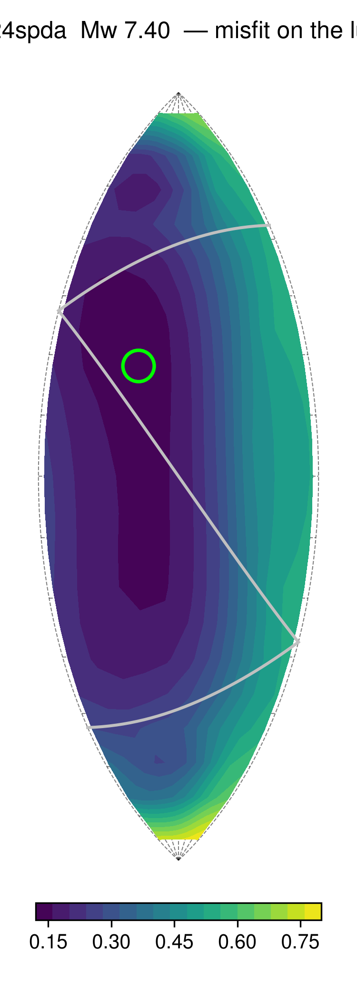

In [9]:
display(Image(os.path.join(R,'mtuq_sota_2024spda/2024spda_misfit_lune.png')))

## B. WISP finite-fault inversion — the plane test
`ffm model run . auto_model -t body -t surf` on both nodal planes of the USGS W-phase tensor
(172/21 and 341/69, within 6° of our own planes).

**The surface-wave GF cap makes this comparison fair by construction.** WISP's surface-wave
Green's-function bank ends at 125 km. With the hypocentre at 127.3 km, **every** fault plane
through the hypocentre exceeds the cap — so surface waves are dropped identically on BOTH
planes (unlike the 2026 case, where an asymmetric silent drop faked a discrimination and had
to be repaired). What remains is a clean controlled experiment:

- identical data: **62 teleseismic body channels** (39 P + 23 SH), zero stations dropped,
  all weights equal across planes;
- identical discretisation, annealing settings, and velocity model;
- the only difference is the plane orientation.

**Fault-domain check (user-spotted).** The auto 15×15 faults (124×102 km) left slip pinned at
the fault edges — up to 41% of peak in the bottom row of the steep plane and ~30% on three
edges of the shallow one. Both planes were re-inverted on an identically enlarged **21×22
grid (173×150 km**; +3 columns each side, +3 rows up-dip, +4 down-dip; Green's functions
recomputed). Edge slip falls to ≤16% of peak on every boundary and the answer is unchanged:

| plane | misfit (auto) | re-anneal | extended fault | peak slip (ext) | slip depth >15% (ext) | slip centroid |
|---|---|---|---|---|---|---|
| shallow 172/21 (USGS FFM choice) | 0.1224 | 0.1224 | 0.1236 | 0.80 m | 104–144 km | 128.3 km |
| **steep 341/69 (Jia choice)** | **0.1099** | **0.1099** | **0.1127** | 1.17 m | 119–163 km | 136.8 km |

**The steep plane fits ~9–10% better under every treatment** — far outside the annealing
scatter (re-anneals reproduce to 4 decimals) and the 1.6% plane difference of the 2026 event.
Teleseismic body waves alone discriminate the disputed planes, and they agree with Jia's
near-field-based verdict against the USGS operational choice.

In [10]:
import re
for p in ('NP1_ref', 'NP2_ref', 'NP1_ext', 'NP2_ext'):
    t = open(os.path.join(E, p, 'modelling_summary.txt')).read()
    m = float(re.search(r'averaged misfit error\s+([\d.]+)', t).group(1))
    print(f"{p}: averaged misfit {m:.4f}")

NP1_ref: averaged misfit 0.1224
NP2_ref: averaged misfit 0.1099
NP1_ext: averaged misfit 0.1236
NP2_ext: averaged misfit 0.1127


### B1. Slip models (extended faults; both planes shown with equal completeness)
The steep plane nucleates at 127 km and ruptures **down-dip** to ~163 km — independently
reproducing the depth extent of Jia's five subevents (120–180 km) that we never told the
inversion about. The shallow plane, geometrically unable to reach those depths (21° dip),
concentrates slip at 104–144 km.

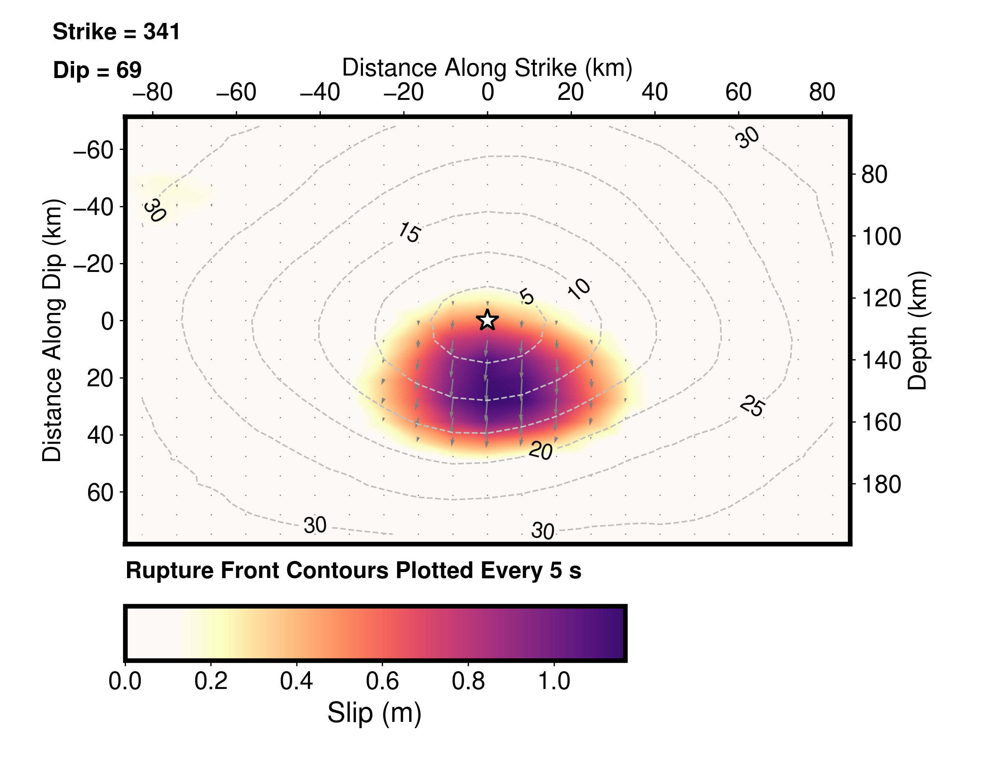

In [11]:
display(Image(os.path.join(E,'NP2_ext/plots/SlipDist_plane0_5s.png')))

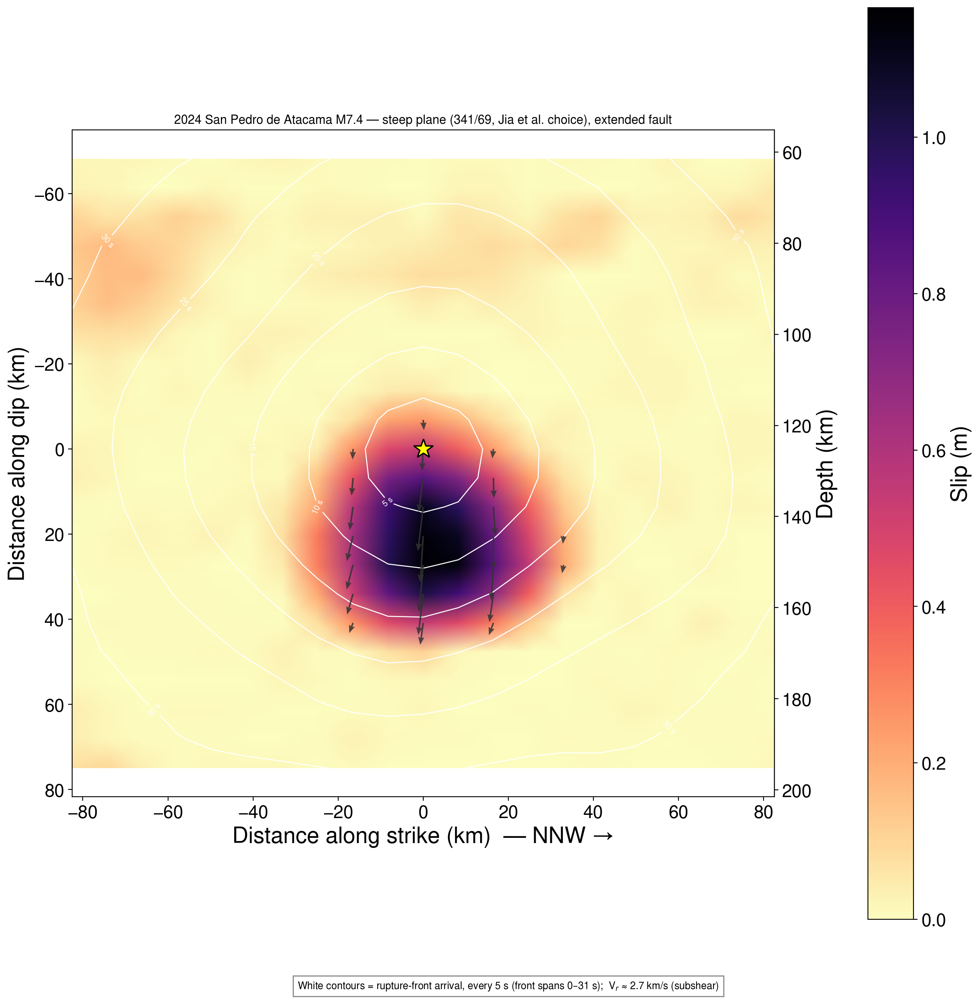

In [12]:
display(Image(os.path.join(E,'NP2_ext/plots/SlipIsochrone_trueScale.png')))

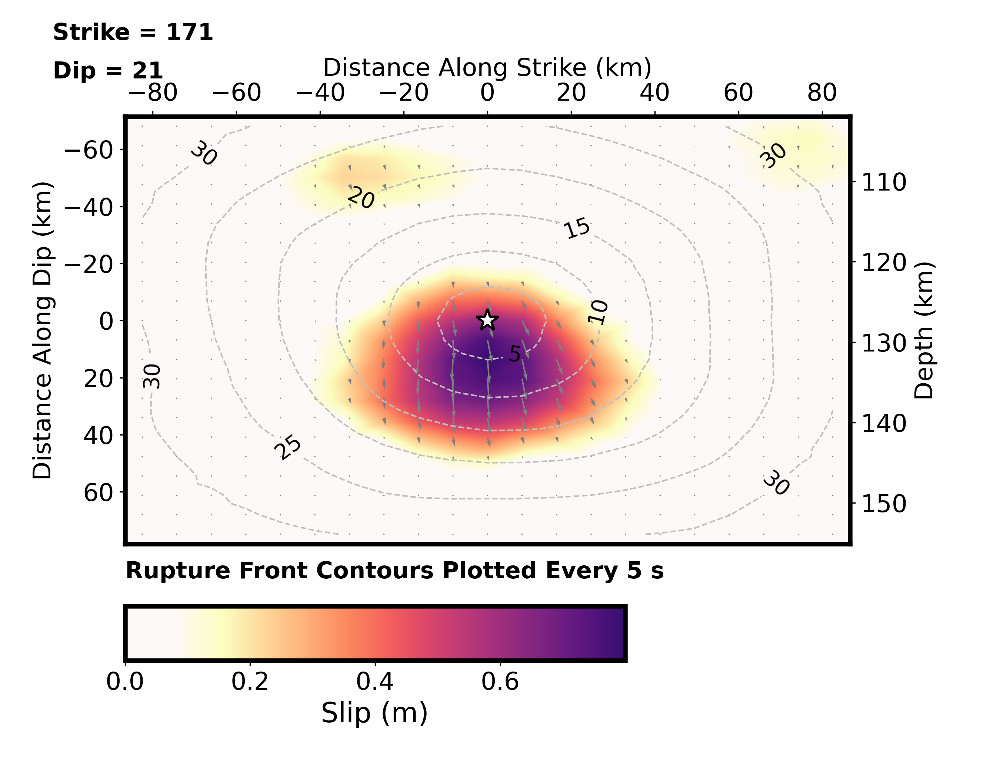

In [13]:
display(Image(os.path.join(E,'NP1_ext/plots/SlipDist_plane0_5s.png')))

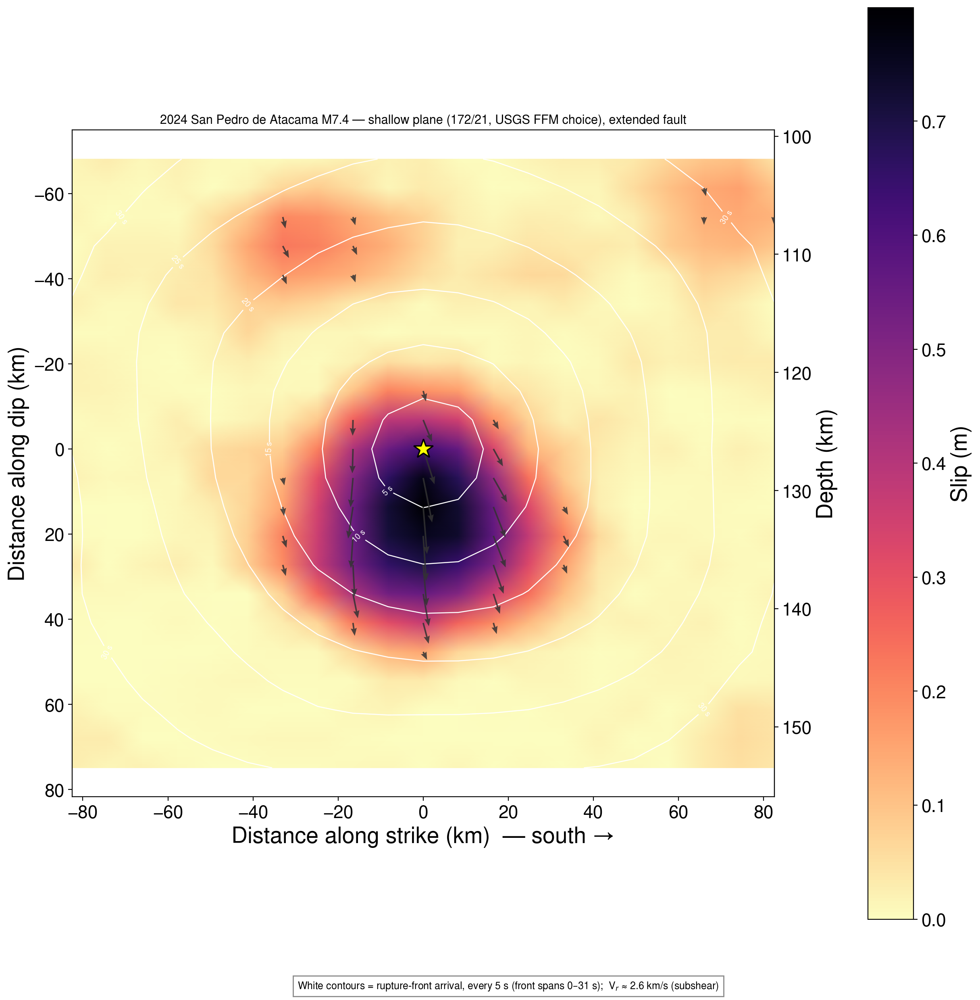

In [14]:
display(Image(os.path.join(E,'NP1_ext/plots/SlipIsochrone_trueScale.png')))

### B2. Moment rate
Both planes recover a **complex, multi-pulse moment-rate function** (main pulses ~10 s and
~18 s, minor episode ~35 s) — consistent with the complexity in the USGS MRF and with Jia's
episodic five-subevent rupture. Model moment 1.44e20 N·m (Mw 7.37).

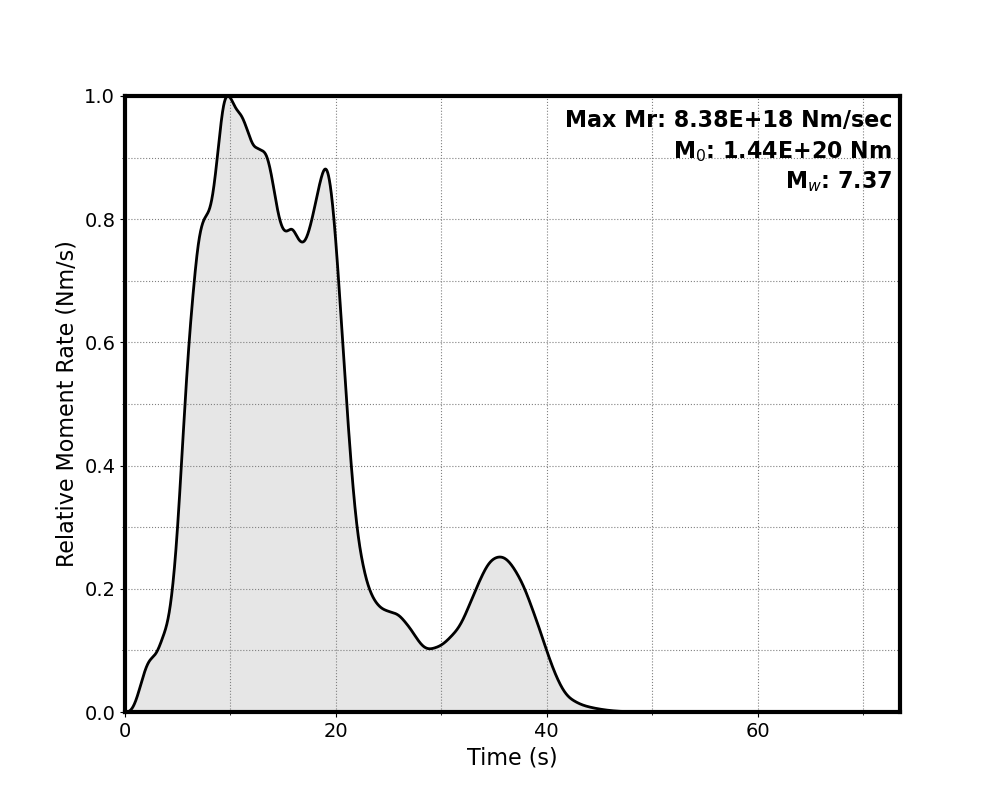

In [15]:
display(Image(os.path.join(E,'NP2_ext/plots/MomentRate.png')))

### B3. Waveform fits (steep plane, extended fault)
39 P + 23 SH channels. Depth phases (pP/sP, ~40–60 s after P at this depth) are well modelled
at all azimuths — they carry the discriminating information.

**Why no WISP Rayleigh/Love fit figures here?** WISP cannot compute them for this event:
its surface-wave Green's-function bank ends at 125 km depth, and with the hypocentre at
127.3 km every candidate plane exceeds the cap, so WISP hard-drops all 61 prepared
surface-wave channels on BOTH planes (the log proof is printed below). nb24 shows WISP
Rayleigh *and* Love fits for the 2026 event, whose fault straddles the cap; here the absence
is symmetric between the planes — which is exactly what makes the body-only comparison fair.
The surface waves of this event are fit instead by the moment tensor (section A1 above),
whose Green's functions have no depth limitation.

In [16]:
import subprocess
print(subprocess.run(['grep','-m2','-B1','Maximum depth',
    os.path.join(B,'event_2024_spda/wisp_auto.log')], capture_output=True, text=True).stdout)
d = json.load(open(os.path.join(E,'NP2_ext/surf_waves.json')))
print(f"prepared surface-wave channels: {len(d)} | used in inversion: 0 (dropped, both planes)")

  warnings.warn(
INFO - Maximum depth larger than 125 km.
--
  warnings.warn(
INFO - Maximum depth larger than 125 km.

prepared surface-wave channels: 55 | used in inversion: 0 (dropped, both planes)


In [17]:
display(Image(os.path.join(E,'NP2_ext/plots/P_body_waves.png')))

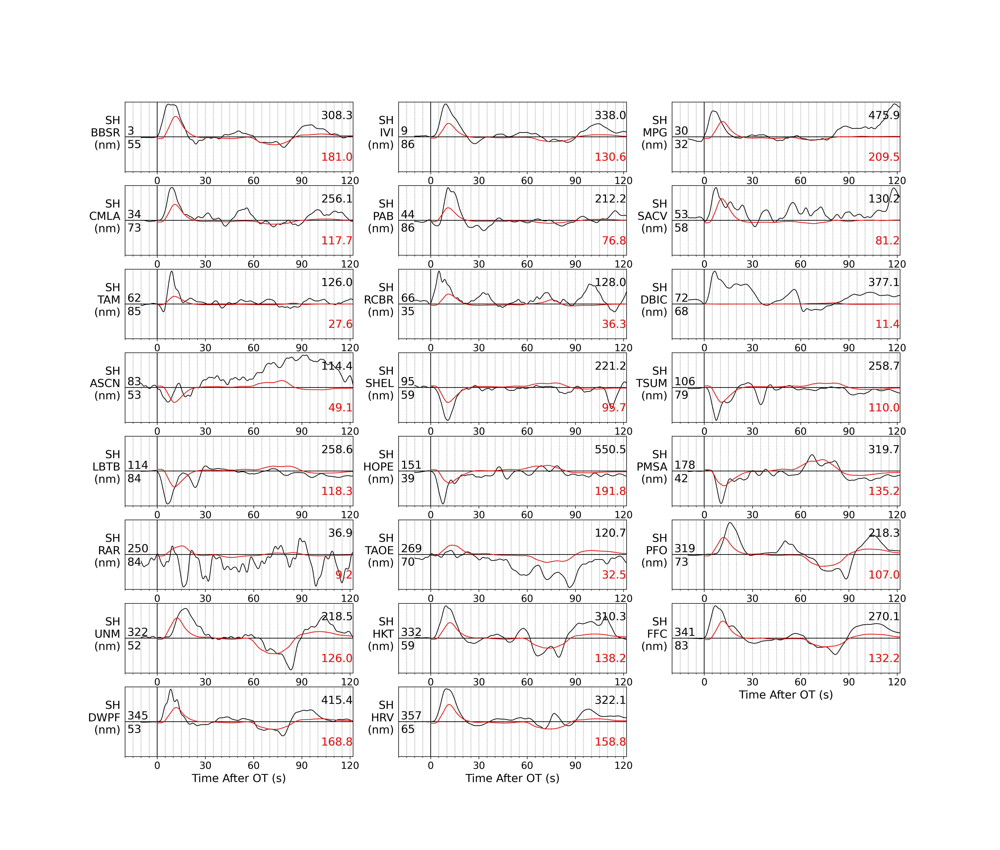

In [18]:
display(Image(os.path.join(E,'NP2_ext/plots/SH_body_waves.png')))

Shallow plane (NP1_ext) P fits, for comparison — visually similar in most panels; the
~10% misfit difference accumulates in the depth-phase group at mid-azimuth stations.

In [19]:
display(Image(os.path.join(E,'NP1_ext/plots/P_body_waves.png')))

### B4. Source dimensions and stress drop
Same recipe as nb24 (μ = 67.5 GPa from WISP's shear model at source depth; Eshelby circular
crack on threshold-trimmed effective area; all thresholds disclosed). **Jia et al. do not
report a stress drop for this event** (they only cite the general tendency of
intermediate-depth events toward high stress drop), so this is a new number.

In [20]:
import fig_fault_isochrone as fi
rows = []
for p, name in (('NP1_ext','shallow 172/21'), ('NP2_ext','steep 341/69')):
    d = os.path.join(E, p)
    s = fi.parse_solution(os.path.join(d, 'Solution.txt'))
    slip, Dx, Dy = s['slip'], s['Dx'], s['Dy']
    mu = float(open(os.path.join(d,'shear_model.txt')).read().split('\n')[2].split()[0])/10.
    cell = Dx*Dy*1e6
    for thr in (0.15, 0.20):
        m = slip >= thr*slip.max()
        A = m.sum()*cell; L = m.any(axis=0).sum()*Dx; W = m.any(axis=1).sum()*Dy
        M0e = mu*slip[m].sum()*cell; Rr = np.sqrt(A/np.pi)
        rows.append(dict(plane=name, thr=thr, L_km=L, W_km=W, A_km2=round(A/1e6),
                         Dbar_m=round(slip[m].mean(),2),
                         dSigma_MPa=round(7/16*M0e/Rr**3/1e6, 1)))
pd.DataFrame(rows)

,plane,thr,L_km,W_km,A_km2,Dbar_m,dSigma_MPa
0,shallow 172/21,0.15,107.25,95.34,4551,0.36,0.9
1,shallow 172/21,0.20,74.25,81.72,3596,0.41,1.1
2,steep 341/69,0.15,66.00,54.48,2753,0.60,1.9
3,steep 341/69,0.20,57.75,54.48,2416,0.65,2.2


Δσ ≈ **1.9–2.2 MPa** on the preferred steep plane (0.9–1.1 MPa on the shallow one) —
the plane choice does not qualitatively change it. Both 2024 and 2026 (~2 MPa) sit at the
gentle end of the cluster's documented range (Tarapacá 2005 ~15 MPa; 1950 ~10 MPa). FFM-based
stress drops are smoothed lower bounds, but the factor-of-several contrast with Tarapacá
survives any plausible trimming choice.

### B5. Does the surface-wave asymmetry between the two events matter? (control test)
A fair objection: WISP used surface waves for the 2026 finite fault but *cannot* for 2024
(source below the 125-km GF-bank cap). Since the two events differ in hypocentral depth by
only 18 km, is the comparison biased by this asymmetry? We test it directly: **re-invert the
2026 finite fault using body waves ONLY** — discarding exactly the surface waves WISP could
not use for 2024 — and compare the slip model.

| 2026 run | data | peak slip | slip depth (>15%) | slip centroid |
|---|---|---|---|---|
| NP1 shallow, final | body + surface | 0.69 m | 105–113 km | 109.0 km |
| NP1 shallow, control | body only | 0.82 m | 106–114 km | 109.5 km |
| NP2 steep, final | body + surface | 0.74 m | 94–121 km | 106.7 km |
| NP2 steep, control | body only | 0.95 m | 98–121 km | 108.0 km |

The slip **depth extent and centroid are essentially unchanged** on both planes (peak slip
rises ~15–20% as the smoothing from the surface-wave term is removed, but its *location* does
not move). At 100–250 s the ~10–50-km ruptures are point sources, so WISP's surface waves
constrain moment — already pinned by the MT — not the finite slip distribution, which is
carried by the body waves. **Both events' finite-fault results are body-wave-driven, so they
are on equal footing;** the surface-wave asymmetry does not affect the plane discrimination or
any slip-based conclusion. (This is why the honest fix for 2024 is not to force surface waves
in — see below — but to recognise the body waves already carry the finite-fault signal.)

*Aside — could 2024 use surface waves at all?* Only by regenerating WISP's precomputed
surface-wave GF bank (currently ~4–126.5 km) to greater depth and overriding the hard-coded
125-km check at runtime — a large rebuild that, per the control test above, would not change
the slip model (it would only reinforce a moment the MT already fixes). MTUQ, by contrast,
uses on-the-fly syngine GFs valid to 700 km, which is why it fits the 2024 surface waves
(section A1) with no such limit.

## C. 2024 vs 2026 — the comparative story
Two intraslab normal-faulting earthquakes, same cluster, same pipeline, ~80 km and 22 months
apart:

| | 2026 Calama M6.9 | 2024 San Pedro de Atacama M7.4 |
|---|---|---|
| hypocentre depth | 109 km | 127 km |
| our MT (preferred) | 194/16/−83, Mw 6.90 | 166/20/−83 (joint), Mw 7.40 (SW) |
| Kagan vs USGS Mww | 8.4° | 3.4° |
| surface waves in FFI | yes (after GF-cap repair) | impossible (both planes > cap) |
| plane discrimination (teleseismic) | **NO** — 0.1402 vs 0.1424 (1.6%) | **YES** — 0.1236 vs 0.1127 (~9%) |
| preferred plane | shallow (marginal; precedent cuts both ways) | **steep** — agrees with Jia, against USGS FFM |
| slip depth extent | 105–113 km (compact lens) | 119–163 km (down-dip elongated) |
| peak slip / duration | 0.70 m / ~15 s | 1.17 m / ~40 s |
| stress drop (Eshelby, 15% trim) | ~2 MPa | ~1.9 MPa |

**Why discriminability flips with size:** plane discrimination from teleseismic body waves
requires the rupture to be extended enough that the conjugate geometries predict measurably
different depth-phase move-out across the fault. The 2026 rupture (~10 km) is a point source
at 25–80 s periods; the 2024 rupture (~50 km down-dip) is not. The pair brackets the
threshold empirically: below ~Mw 7, don't expect teleseismic fits to choose the plane.

### Did the two events rupture different fault planes?
The mechanisms differ by 30.9° (Kagan), so **no common plane exists** regardless of which
conjugates are chosen — two distinct structures in the same volume, not repeat ruptures of one
fault. Per event: 2024 = steep plane with confidence (our misfit + slip-depth consistency +
Jia's near-field evidence). 2026 = undetermined (1.6% tie); the cluster precedent now
strengthened by 2024 makes the steep plane (7/74) the more likely guess, but even then its
strike differs from the 2024 plane by ~26°. Honest conclusion: **the cluster does not host a
single master fault** — its large events occur on variably oriented planes (subhorizontal
Tarapacá 2005, steep N-striking 2024, either plane in 2026) within a ~25–30-km-thick
seismogenic volume, under a common down-dip-extension stress state (every T-axis in the
family is slab-down-dip).

### How can a normal-faulting rupture run at (or above) the shear-wave speed?
Jia's directivity gives an *average* Vr = 4.2 km/s ≈ 0.93 Vs — in the "forbidden zone"
between Rayleigh and shear speeds — which they read as **mixed rupture: subshear segments +
episodic supershear bursts** (intermittent, not sustained). The intuition that supershear
requires strike-slip faulting conflates faulting *style* with crack *mode*:

- Rupture propagating **parallel to the slip vector** is **mode II** (in-plane): it can pass
  the Burridge–Andrews transition and run between the Eshelby speed (√2·Vs) and Vp. Rupture
  perpendicular to slip is mode III (anti-plane), capped at Vs.
- Strike-slip faults slip horizontally, so their *along-strike* direction is mode II — hence
  the classic supershear observations (Kunlun 2001, Denali 2002, Palu 2018) are long
  unilateral strike-slip ruptures. That's an observational bias, not a mechanical rule.
- A **dip-slip fault slips down-dip, so its down-dip direction is mode II**. The 2024 rupture
  propagated down-dip on a steep normal fault (rake −95) — nearly pure mode II in its
  propagation direction. Supershear episodes are mechanically natural here; what's rare is the
  observation, because dip-slip faults offer short mode-II run distances (~50–80 km) compared
  to great strike-slip ruptures.
- Deep precedent: supershear was documented for the 640-km-deep Mw 6.7 aftershock of the 2013
  Sea of Okhotsk earthquake (Zhan et al. 2014, Science) — a dip-slip event. Neither shallow
  depth, a free surface, nor strike-slip geometry is required.
- Jia's thermal-runaway interpretation and the fast rupture are two faces of one coin: runaway
  weakening collapses fault strength behind the front, boosting the energy-release rate that
  drives the supershear transition — plausibly in bursts where weakening is strongest.

## D. Honest limitations
1. **Teleseismic-only.** No strong motion, no GNSS, no aftershock relocations. Our steep-plane
   preference is one independent line of evidence that agrees with Jia's multi-data verdict;
   it is not a replacement for it.
2. **No surface waves in the FFI.** Physically impossible (source below the GF bank) — the FFI
   rests on 62 body channels; the MT is surface-wave-anchored and the two agree on moment.
3. **No supershear test of our own.** WISP ran with auto rupture-velocity settings; we did not
   attempt to resolve Jia's episodic ~4.2 km/s. Our MRF complexity is consistent with, but
   does not demonstrate, episodic supershear.
4. **Depth summary.** With slip spanning ~45 km of depth, one "centroid depth" is a weak
   summary; we quote slip-weighted centroids per plane (128.3 / 136.8 km).
5. **Mw 7.25 (joint) vs 7.40 (SW-only)**: the body band favours smaller moment for a 40-s
   source; we adopt the SW-anchored 7.40 and use the joint run for mechanism only.

## Summary
| result | value |
|---|---|
| MT SW-only | Mw 7.40, 176/20/−70 — 6.3° from USGS Mww |
| MT joint (body 35–80 s + SW) | Mw 7.25, 166/20/−83 — **3.4° from Mww**; conj 5.8° from Jia's plane |
| FFI fair comparison | 62 identical body channels, both planes, zero drops; surface waves impossible on both |
| shallow plane (USGS FFM choice) | misfit 0.1236 (ext), slip 104–144 km, peak 0.80 m |
| **steep plane (Jia choice)** | **misfit 0.1127 (ext, ~9% better)**, slip 119–163 km ≈ Jia's 120–180 km, peak 1.17 m |
| robustness | re-anneals reproduce to 4 decimals; identically enlarged fault domains (edge slip ≤16%) preserve the ordering |
| moment / stress drop | 1.44e20 N·m (Mw 7.37); Δσ ≈ 1.9–2.2 MPa (new — Jia report none) |
| moment rate | multi-pulse, ~40 s, matches USGS/Jia complexity |

**Take-homes**
1. The deep-event MTUQ protocol transferred to a Mw 7.4 with one scaling (35–80 s body band);
   both wave-type choices agree to 5°, and adding body waves moved us *closer* to the Mww
   (3.4°). A silent `use_bw` default bug was caught by looking at the waveform-fit figure.
2. For a rupture this large, teleseismic body waves ALONE discriminate the disputed nodal
   planes: **the steep plane wins by ~9–10%** under every treatment, independently confirming
   Jia et al. against the USGS operational finite-fault choice.
3. The steep-plane slip model reproduces Jia's 120–180 km slip depths with no near-field data
   — down-dip rupture into the slab, through the thermal-runaway depth range.
4. Combined with nb24's 2026 near-tie, the pair brackets the size threshold at which
   teleseismic plane discrimination turns on (~10 km: no; ~50 km: yes).
5. Episodic supershear on a normal fault is mechanically natural: down-dip propagation on a
   dip-slip fault is mode II — the crack mode, not the faulting style, controls the speed
   limit.